In [1]:
import os
import sys
sys.path.append('../..')

import pyedflib
import numpy as np
import os
import matplotlib.pyplot as plt
from scipy import signal
from imp import reload
import pandas as pd
import pywt
import readFiles
import databasePreparation
import preProcessing
import readEogertData
import math
from scipy import ndimage, misc
import json
import string
import neurokit2 as nk
import mne
import eeg_label
import evaluationUtils

from visualization import plotEogElectrodesSignal, plotVertHorEOG, plotSaccadeSpanInSignal, plotTransformAndPeaks, plotSaccadeGTSpanInSignal, plotSaccadeIntervals
from classificationUtils import peaksToBinary, peaksBinarySaccadeAnalysisVersion2, peaksBinaryToString, countEyeMovements, findPeaks, numSamplesOverlap
from evaluationUtils import countCorrectDetected, calculatePrecision, calculateRecall, normalizeSaccadeIntervals, normalizeBlinkIntervals

## Reading the signal

This first part reads the edf file from a specific path and finds the channels that will be used for the analysis of the EOG.

These index of these channels are specified in the channelsOfInterest list.

In [48]:
# Reading the signals from the EDF file

sectionName = 'ricardo3'
fileName = 'C:/Users/Ricardo/source/enac-eog-analysis/src/labelAnnotation/EOGLabel-main/{}.edf'.format(sectionName)
channelsOfInterest = [64, 65, 66, 67, 68, 69]

leftElec = 3
rightElec = 2
downElec = 1
upElec = 0

# Reading the signals from the EDF file
try:
    f = pyedflib.EdfReader(fileName)
except FileNotFoundError as e:
    print(e)
    print('\n The {} file was not found.'.format(fileName))


#channelsOfInterest = [256, 257, 258, 259]
numEyeChannels = len(channelsOfInterest)

# signal_labels = f.getSignalLabels()
# print(signal_labels)

# Creation of a zero array the correct dimensions.
eyesData = np.zeros((numEyeChannels, f.getNSamples()[0]))

for i, channel in enumerate(channelsOfInterest):
    eyesData[i, :] = f.readSignal(channel)

f.close()

freqSample = 2048

## Pre processing of the EOG and classification of the eye movements

The signal is pre processed using a median filter with a sliding window of 200 samples.

Then the CWT Mexican Wavelet is applied and its coeficients are used for peak detections.

The peaks of the coeficients of the CWT are used to detect the movements in the EOG signal.

In the vertical EOG, a negative peak followed by a positive peak is considered an upwards saccade, for example.


Vertical and Horizontal Denoised signal Plot


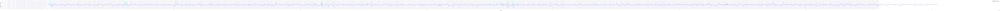

Vertical Saccades Plot


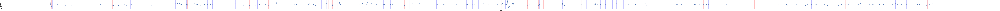

Vertical Saccades GroundTruth Plot


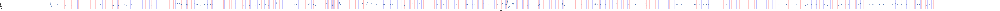

Vertical CWT Peaks Plot
len Peaks before 621
len Peaks after 621


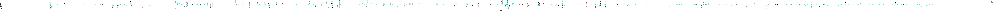

Horizontal Saccades Plot


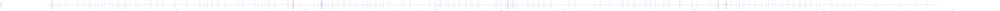

Horizontal Saccades GroundTruth Plot


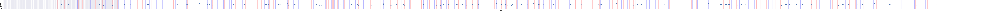

Horizontal CWT Peaks Plot
len Peaks before 490
len Peaks after 490


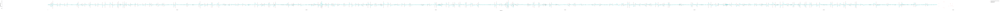

In [49]:
resultsPath = 'results/blinksIgnoredResults/'

verticalEOG, horizontalEOG = preProcessing.electrodesToVertHori(eyesData, leftElec, rightElec, downElec, upElec)

rawVerticalEOG = verticalEOG
rawHorizontalEOG = horizontalEOG

verticalEogDenoised = ndimage.median_filter(verticalEOG, size = 200)
horizontalEogDenoised = ndimage.median_filter(horizontalEOG, size = 200)

verticalEOG = verticalEogDenoised
horizontalEOG = horizontalEogDenoised

verticalEOG = databasePreparation.resampleSignal(verticalEOG, 1000, 2048)
horizontalEOG = databasePreparation.resampleSignal(horizontalEOG, 1000, 2048)

# verticalEOG = preProcessing.cutArtifacts(verticalEOG, 700)
# horizontalEOG = preProcessing.cutArtifacts(horizontalEOG, 700)

verticalEOG3 = np.reshape(verticalEOG, (len(verticalEOG),1))
horizontalEOG3 = np.reshape(horizontalEOG, (len(horizontalEOG),1))

coefVertMexHat, freqsVertMexHat = pywt.cwt(verticalEOG, 30, 'mexh')
coefHoriMexHat, freqsHoriMexHat = pywt.cwt(horizontalEOG, 30, 'mexh')

coefVertMexHat1 = np.reshape(coefVertMexHat, (len(coefVertMexHat[0]),1))
coefHoriMexHat1 = np.reshape(coefHoriMexHat, (len(coefHoriMexHat[0]),1))

#coefVertMexHat2 = preProcessing.zeroPadArtifacts(coefVertMexHat1, 70)

# Peakfinding

# Flatten the vectors so they can be used in the signal.find_peaks function
vertCwt = coefVertMexHat1.flatten()
horiCwt = coefHoriMexHat1.flatten()

# Thresholds of the saccade peaks
peaksHeight = np.array([90, 600])
minSaccadeDistance = 100

# Returns peaks' indexes and their properties in a dict
# The peaks are detected in the module version of signal in order to find the negative peaks as well
peaksV = findPeaks(vertCwt, peaksHeight[0], peaksHeight[1], minSaccadeDistance)
peaksH = findPeaks(horiCwt, peaksHeight[0], peaksHeight[1], minSaccadeDistance)

vertPeaksBinary = peaksToBinary(peaksV, vertCwt)
horiPeaksBinary = peaksToBinary(peaksH, horiCwt)

upSaccadeStartEnd, downSaccadeStartEnd = peaksBinarySaccadeAnalysisVersion2(vertPeaksBinary, jumpIntervalThreshold=500)
leftSaccadeStartEnd, rightSaccadeStartEnd = peaksBinarySaccadeAnalysisVersion2(horiPeaksBinary, jumpIntervalThreshold=500)

# Reading the groundtruth for this file

saccadeGroundTruth = databasePreparation.loadNumpyArray('C:/Users/Ricardo/source/enac-eog-analysis/src/labelAnnotation/EOGLabel-main/labels/{}_saccadeTimeStamp.npy'.format(sectionName))
saccadeGroundTruth = saccadeGroundTruth.tolist()

blinkGroundTruth = databasePreparation.loadNumpyArray('C:/Users/Ricardo/source/enac-eog-analysis/src/labelAnnotation/EOGLabel-main/labels/{}_blinkTimeStamp.npy'.format(sectionName))
blinkGroundTruth = blinkGroundTruth.tolist()

up_correctSaccades, up_incorrectSaccades = evaluationUtils.saccadeEvaluation(upSaccadeStartEnd, 'up', saccadeGroundTruth)
down_correctSaccades, down_incorrectSaccades = evaluationUtils.saccadeEvaluation(downSaccadeStartEnd, 'down', saccadeGroundTruth)
left_correctSaccades, left_incorrectSaccades = evaluationUtils.saccadeEvaluation(leftSaccadeStartEnd, 'left', saccadeGroundTruth)
right_correctSaccades, right_incorrectSaccades = evaluationUtils.saccadeEvaluation(rightSaccadeStartEnd, 'right', saccadeGroundTruth)

# Removing blinks from the saccade detection

for startEnd in upSaccadeStartEnd:
    for blink in blinkGroundTruth:
        if numSamplesOverlap(startEnd, blink) != 0:
            upSaccadeStartEnd.remove(startEnd)
            break
            
for startEnd in downSaccadeStartEnd:
    for blink in blinkGroundTruth:
        if numSamplesOverlap(startEnd, blink) != 0:
            downSaccadeStartEnd.remove(startEnd)
            break

# Detecting saccades candidates and blink candidates
vertPeaksString = peaksBinaryToString(vertPeaksBinary[2])
horiPeaksString = peaksBinaryToString(horiPeaksBinary[2])


#All the plots

print('Vertical and Horizontal Denoised signal Plot')
plotVertHorEOG(verticalEogDenoised, horizontalEogDenoised,  mode='both')
plt.show()

print('Vertical Saccades Plot')
plotSaccadeSpanInSignal(verticalEOG, upSaccadeStartEnd, downSaccadeStartEnd)
plt.show()

print('Vertical Saccades GroundTruth Plot')
plotSaccadeGTSpanInSignal(verticalEOG, saccadeGroundTruth, 'vertical')
plt.show()

print('Vertical CWT Peaks Plot')
plotTransformAndPeaks(coefVertMexHat1, peaksV, verticalEOG, 'Vertical')
plt.show()

print('Horizontal Saccades Plot')
plotSaccadeSpanInSignal(horizontalEOG, leftSaccadeStartEnd, rightSaccadeStartEnd)
plt.show()

print('Horizontal Saccades GroundTruth Plot')
plotSaccadeGTSpanInSignal(horizontalEOG, saccadeGroundTruth, 'horizontal')
plt.show()

print('Horizontal CWT Peaks Plot')
plotTransformAndPeaks(coefHoriMexHat1, peaksH, horizontalEOG, 'Horizontal')
plt.show() 



 Number of saccades in the groundtruth:  284


118 120 119 120


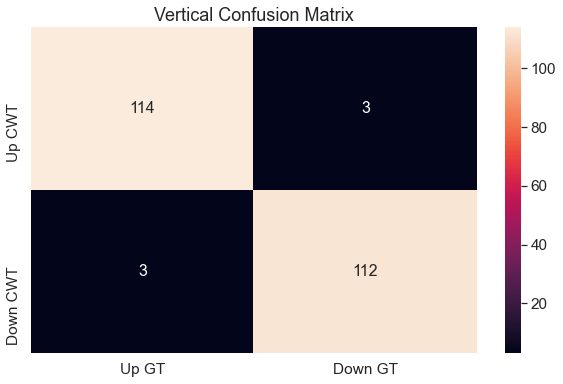

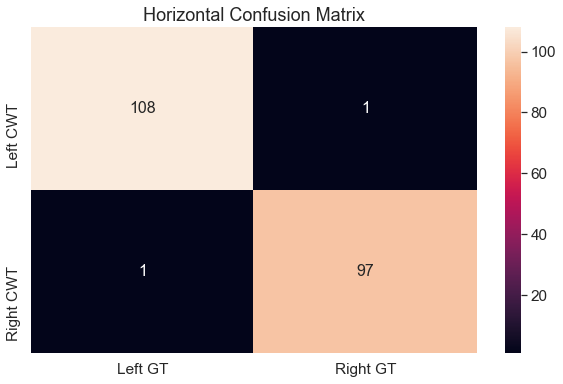


Precision:  0.88

Recall:  0.98

F1 Score: 0.93

False Positives (up, down, left, right)s:  14 12 17 15


In [50]:
print('\n Number of saccades in the groundtruth: ', len(saccadeGroundTruth))
print('\n')

numUpGT = 0
numDownGT = 0
numLeftGT = 0
numRightGT = 0

for gt in saccadeGroundTruth:
    if 'up' in gt[3]:
        numUpGT = numUpGT + 1
    if 'down' in gt[3]:
        numDownGT = numDownGT + 1
    if 'left' in gt[3]:
        numLeftGT = numLeftGT + 1
    if 'right' in gt[3]:
        numRightGT = numRightGT + 1
        
print(numUpGT, numDownGT, numLeftGT, numRightGT)
    
allDirSaccadeStartEnd = [upSaccadeStartEnd, downSaccadeStartEnd, leftSaccadeStartEnd, rightSaccadeStartEnd]
evaluationUtils.confusionMatrix(allDirSaccadeStartEnd, saccadeGroundTruth, resultsPath, sectionName)

[upSaccadeTP, upSaccadeFN, upSaccadeFP, downSaccadeTP, downSaccadeFN, downSaccadeFP, leftSaccadeTP,
     leftSaccadeFN, leftSaccadeFP, rightSaccadeTP, rightSaccadeFN, rightSaccadeFP] = evaluationUtils.saccadeConfusion(
        allDirSaccadeStartEnd, saccadeGroundTruth)

False Positives of the Vertical Signal Analysis


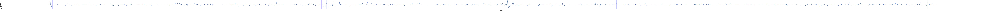

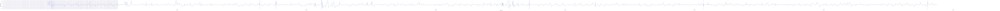

False Positives of the Horizontal Signal Analysis


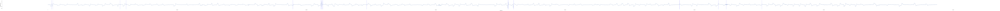

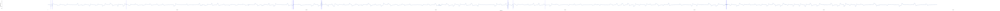

true Positives of the Vertical Signal Analysis


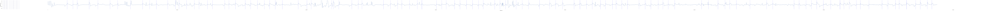

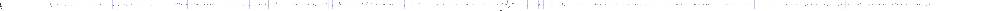

True Positives of the Horizontal Signal Analysis


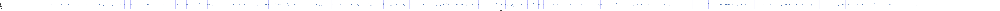

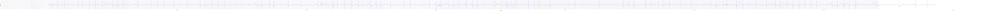

In [51]:
# Plotting the false positives

print('False Positives of the Vertical Signal Analysis')
plotSaccadeIntervals(verticalEOG, upSaccadeFP)
plotSaccadeIntervals(verticalEOG, downSaccadeFP)

plt.show() 

print('False Positives of the Horizontal Signal Analysis')
plotSaccadeIntervals(horizontalEOG, leftSaccadeFP)
plotSaccadeIntervals(horizontalEOG, rightSaccadeFP)

plt.show() 


#Plotting the true positives

print('true Positives of the Vertical Signal Analysis')
plotSaccadeIntervals(verticalEOG, upSaccadeTP)
plotSaccadeIntervals(verticalEOG, downSaccadeTP)

plt.show()

print('True Positives of the Horizontal Signal Analysis')
plotSaccadeIntervals(horizontalEOG, leftSaccadeTP)
plotSaccadeIntervals(horizontalEOG, rightSaccadeTP)

plt.show() 


Number of saccades used for the mean: 114 out of 118 saccades present in the GroundTruth
96.61016949152543% Usage of GT


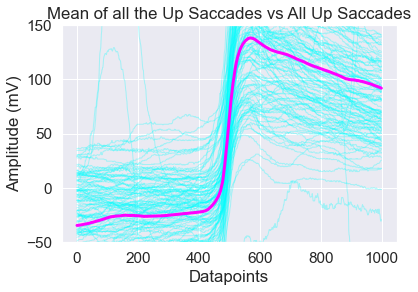

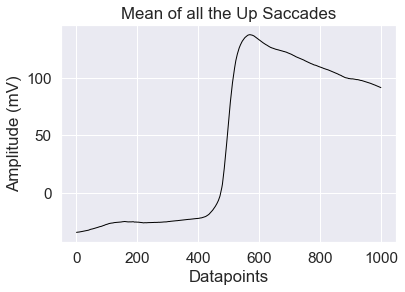

In [52]:
# Averaging of all the up saccades from current dataset

intervalNormalSize = 1000
normalizedSaccades = normalizeSaccadeIntervals(upSaccadeTP, intervalNormalSize)
numNormalizedSaccades = len(normalizedSaccades)
print('Number of saccades used for the mean: {} out of {} saccades present in the GroundTruth'.format(numNormalizedSaccades, numUpGT))
print('{}% Usage of GT'.format(numNormalizedSaccades/numUpGT*100))

meanUpSaccade = np.zeros(intervalNormalSize)

normalizedSaccadesDatapoints = []
for normalizedSaccade in normalizedSaccades:
    normalizedSaccadeDataPoints = verticalEOG[int(normalizedSaccade[0]): int(normalizedSaccade[1])]
    normalizedSaccadesDatapoints.append(normalizedSaccadeDataPoints)

for upSaccadeDatapoints in normalizedSaccadesDatapoints:
    for i, datapoint in enumerate(upSaccadeDatapoints):
        meanUpSaccade[i] = meanUpSaccade[i] + datapoint
        
meanUpSaccade[:] = meanUpSaccade[:]/numNormalizedSaccades

for normSaccadeDatapoints in normalizedSaccadesDatapoints:
    plt.plot(normSaccadeDatapoints, "cyan", linewidth=1, alpha=0.3)

plt.plot(meanUpSaccade, "magenta", linewidth=3)
plt.xlabel('Datapoints')
plt.ylabel('Amplitude (mV)')
plt.ylim(-50, 150)
plt.title('Mean of all the Up Saccades vs All Up Saccades')
#plt.savefig('{}{}_averageUpSaccadeComparison.png'.format(resultsPath, sectionName))
plt.show()

plt.plot(meanUpSaccade, "black", linewidth=1)
plt.xlabel('Datapoints')
plt.ylabel('Amplitude (mV)')
plt.title('Mean of all the Up Saccades')
#plt.savefig('{}{}_averageUpSaccade.png'.format(resultsPath, sectionName))
plt.show()

Number of saccades used for the mean: 112 out of 120 saccades present in the GroundTruth
93.33333333333333% Usage of GT


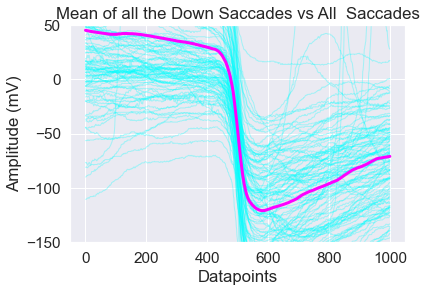

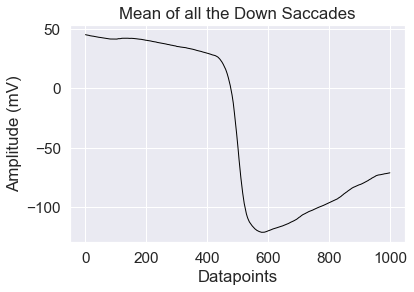

In [53]:
# Averaging of all the down saccades from current dataset

intervalNormalSize = 1000
normalizedSaccades = normalizeSaccadeIntervals(downSaccadeTP, intervalNormalSize)
numNormalizedSaccades = len(normalizedSaccades)
print('Number of saccades used for the mean: {} out of {} saccades present in the GroundTruth'.format(numNormalizedSaccades, numDownGT))
print('{}% Usage of GT'.format(numNormalizedSaccades/numDownGT*100))

meanDownSaccade = np.zeros(intervalNormalSize)

normalizedSaccadesDatapoints = []
for normalizedSaccade in normalizedSaccades:
    normalizedSaccadeDataPoints = verticalEOG[int(normalizedSaccade[0]): int(normalizedSaccade[1])]
    normalizedSaccadesDatapoints.append(normalizedSaccadeDataPoints)

for downSaccadeDatapoints in normalizedSaccadesDatapoints:
    for i, datapoint in enumerate(downSaccadeDatapoints):
        meanDownSaccade[i] = meanDownSaccade[i] + datapoint
        
meanDownSaccade[:] = meanDownSaccade[:]/numNormalizedSaccades

for normSaccadeDatapoints in normalizedSaccadesDatapoints:
    plt.plot(normSaccadeDatapoints, "cyan", linewidth=1, alpha=0.3)
    
plt.plot(meanDownSaccade, "magenta", linewidth=3)
plt.xlabel('Datapoints')
plt.ylabel('Amplitude (mV)')
plt.ylim(-150, 50)
plt.title('Mean of all the Down Saccades vs All  Saccades')
#plt.savefig('{}{}_averageDownSaccadeComparison.png'.format(resultsPath, sectionName))
plt.show()

plt.plot(meanDownSaccade, "black", linewidth=1)
plt.xlabel('Datapoints')
plt.ylabel('Amplitude (mV)')
plt.title('Mean of all the Down Saccades')
#plt.savefig('{}{}_averageDownSaccade.png'.format(resultsPath, sectionName))
plt.show()

Number of saccades used for the mean: 108 out of 119 saccades present in the GroundTruth
90.75630252100841% Usage of GT


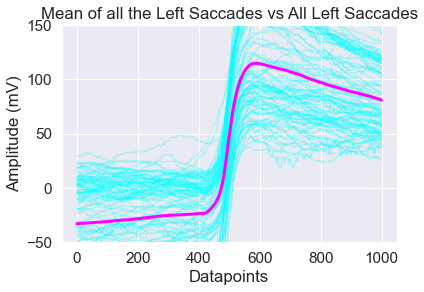

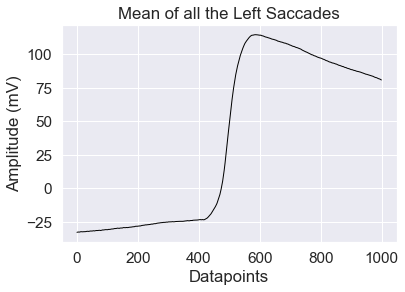

In [54]:
# Averaging of all the left saccades from current dataset

intervalNormalSize = 1000
normalizedSaccades = normalizeSaccadeIntervals(leftSaccadeTP, intervalNormalSize)
numNormalizedSaccades = len(normalizedSaccades)
print('Number of saccades used for the mean: {} out of {} saccades present in the GroundTruth'.format(numNormalizedSaccades, numLeftGT))
print('{}% Usage of GT'.format(numNormalizedSaccades/numLeftGT*100))

meanLeftSaccade = np.zeros(intervalNormalSize)

normalizedSaccadesDatapoints = []
for normalizedSaccade in normalizedSaccades:
    normalizedSaccadeDataPoints = horizontalEOG[int(normalizedSaccade[0]): int(normalizedSaccade[1])]
    normalizedSaccadesDatapoints.append(normalizedSaccadeDataPoints)

for leftSaccadeDatapoints in normalizedSaccadesDatapoints:
    for i, datapoint in enumerate(leftSaccadeDatapoints):
        meanLeftSaccade[i] = meanLeftSaccade[i] + datapoint
        
meanLeftSaccade[:] = meanLeftSaccade[:]/numNormalizedSaccades

for normSaccadeDatapoints in normalizedSaccadesDatapoints:
    plt.plot(normSaccadeDatapoints, "cyan", linewidth=1, alpha=0.3)
    
plt.plot(meanLeftSaccade, "magenta", linewidth=3)
plt.xlabel('Datapoints')
plt.ylabel('Amplitude (mV)')
plt.ylim(-50, 150)
plt.title('Mean of all the Left Saccades vs All Left Saccades')
#plt.savefig('{}{}_averageLeftSaccadeComparison.png'.format(resultsPath, sectionName))
plt.show()

plt.plot(meanLeftSaccade, "black", linewidth=1)
plt.xlabel('Datapoints')
plt.ylabel('Amplitude (mV)')
plt.title('Mean of all the Left Saccades')
#plt.savefig('{}{}_averageLeftSaccade.png'.format(resultsPath, sectionName))
plt.show()

Number of saccades used for the mean: 97 out of 120 saccades present in the GroundTruth
80.83333333333333% Usage of GT


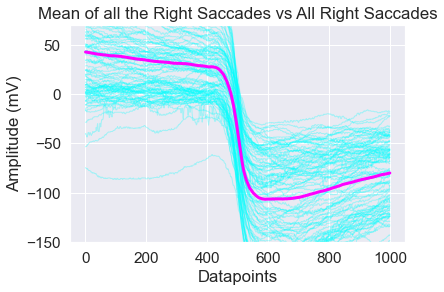

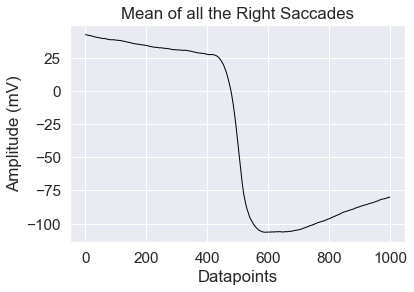

In [55]:
# Averaging of all the right saccades from current dataset

intervalNormalSize = 1000
normalizedSaccades = normalizeSaccadeIntervals(rightSaccadeTP, intervalNormalSize)
numNormalizedSaccades = len(normalizedSaccades)
print('Number of saccades used for the mean: {} out of {} saccades present in the GroundTruth'.format(numNormalizedSaccades, numRightGT))
print('{}% Usage of GT'.format(numNormalizedSaccades/numRightGT*100))

meanRightSaccade = np.zeros(intervalNormalSize)

normalizedSaccadesDatapoints = []
for normalizedSaccade in normalizedSaccades:
    normalizedSaccadeDataPoints = horizontalEOG[int(normalizedSaccade[0]): int(normalizedSaccade[1])]
    normalizedSaccadesDatapoints.append(normalizedSaccadeDataPoints)

for rightSaccadeDatapoints in normalizedSaccadesDatapoints:
    for i, datapoint in enumerate(rightSaccadeDatapoints):
        meanRightSaccade[i] = meanRightSaccade[i] + datapoint
        
meanRightSaccade[:] = meanRightSaccade[:]/numNormalizedSaccades

for normSaccadeDatapoints in normalizedSaccadesDatapoints:
    plt.plot(normSaccadeDatapoints, "cyan", linewidth=1, alpha=0.3)
    
plt.plot(meanRightSaccade, "magenta", linewidth=3)
plt.xlabel('Datapoints')
plt.ylabel('Amplitude (mV)')
plt.ylim(-150, 70)
plt.title('Mean of all the Right Saccades vs All Right Saccades')
#plt.savefig('{}{}_averageRightSaccadeComparison.png'.format(resultsPath, sectionName))
plt.show()

plt.plot(meanRightSaccade, "black", linewidth=1)
plt.xlabel('Datapoints')
plt.ylabel('Amplitude (mV)')
plt.title('Mean of all the Right Saccades')
#plt.savefig('{}{}_averageRightSaccade.png'.format(resultsPath, sectionName))
plt.show()

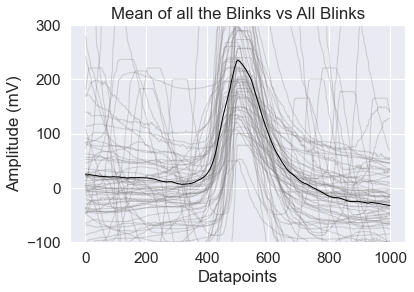

In [56]:
# Showing the average of the blink and all the blinks in the same graph using the blink groundtruth hopefully

blinkIntervalNormalSize = 1000

# Turning the blink indexes into integers
for blink in blinkGroundTruth:
    blink[0] = int(float(blink[0]))
    blink[1] = int(float(blink[1]))
    blink[2] = int(float(blink[2]))
                   
meanBlink = np.zeros(blinkIntervalNormalSize)
numBlinks = len(blinkGroundTruth)

blinksData = []
normalizedBlinkGroundTruth = normalizeBlinkIntervals(blinkGroundTruth, verticalEOG, blinkIntervalNormalSize)


for blink in normalizedBlinkGroundTruth:
    blinkDatapoints = verticalEOG[blink[0] : blink[1]]
    blinksData.append(blinkDatapoints)
        
for blinkDatapoints in blinksData:
    for i, datapoint in enumerate(blinkDatapoints):
        meanBlink[i] = meanBlink[i] + datapoint
        
meanBlink[:] = meanBlink[:]/numBlinks

for blink in blinksData:
    plt.plot(blink, "grey", linewidth=1, alpha=0.3)
    
plt.plot(meanBlink, "black", linewidth=1)
plt.xlabel('Datapoints')
plt.ylabel('Amplitude (mV)')
plt.ylim(-100, 300)
plt.title('Mean of all the Blinks vs All Blinks')
plt.savefig('{}{}_averageBlinkComparison.png'.format(resultsPath, sectionName), bbox_inches='tight')
plt.show()
    

[59138, 60138, 268, '']


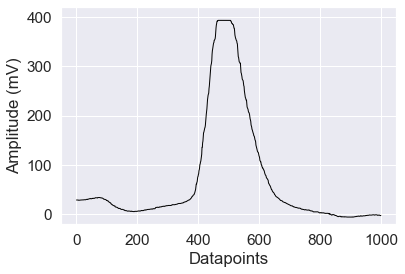

In [57]:
# Making some extra figures for the report.

firstBlink = normalizedBlinkGroundTruth[3]
print(firstBlink)
firstBlinkDatapoints = verticalEOG[firstBlink[0]: firstBlink[1]]

plt.plot(firstBlinkDatapoints, "black", linewidth=1)
plt.xlabel('Datapoints')
plt.ylabel('Amplitude (mV)')
plt.ylim(-20, 420)
plt.savefig('{}{}_exampleBlink.png'.format(resultsPath, sectionName), bbox_inches='tight')
plt.show()

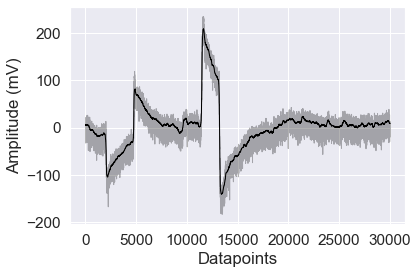

In [58]:
# Making some figures for the report part 2
start = 35000
end = 65000

plt.plot(rawVerticalEOG[start:end],'black', linewidth=1, alpha=0.3)
plt.plot(verticalEogDenoised[start:end], 'black', linewidth=1, alpha=1)
plt.xlabel('Datapoints')
plt.ylabel('Amplitude (mV)')
plt.savefig('{}{}_exampleDenoising.png'.format(resultsPath, sectionName), bbox_inches='tight')
plt.show()

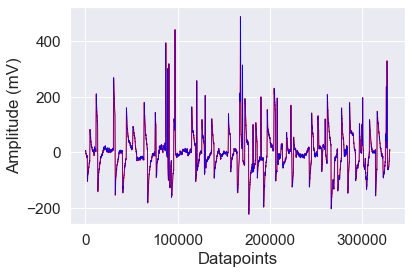

In [59]:
# Making some figures for the report part 2
verticalEogDetrended = signal.detrend(verticalEogDenoised)

start = 35000
end = 365000

# Pre-processing: baseline wandering/drift mitigation
sos2 = signal.butter(1, 0.04, 'highpass', fs=freqSample, output='sos')
verticalEogHighpassed = signal.sosfilt(sos2, verticalEogDenoised)

plt.plot(verticalEogDenoised[start:end],'red', linewidth=1, alpha=1)
plt.plot(verticalEogDetrended[start:end], 'blue', linewidth=0.5, alpha=1)
plt.xlabel('Datapoints')
plt.ylabel('Amplitude (mV)')
plt.savefig('{}{}_exampleBaselineWandering.png'.format(resultsPath, sectionName), bbox_inches='tight')
plt.show()

Vertical and Horizontal Denoised signal Plot


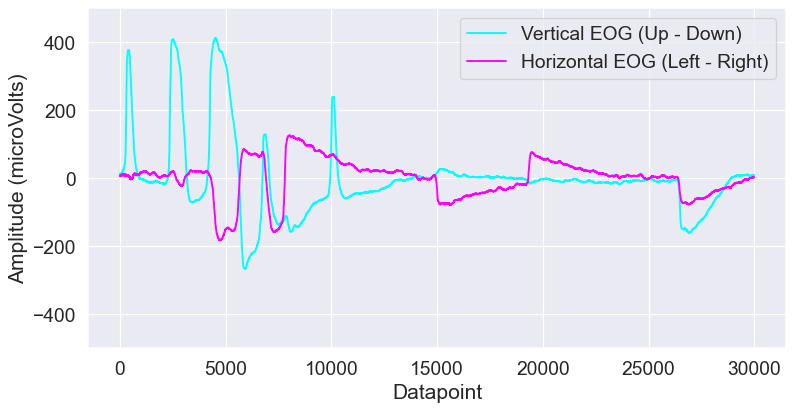

Vertical Saccades Plot


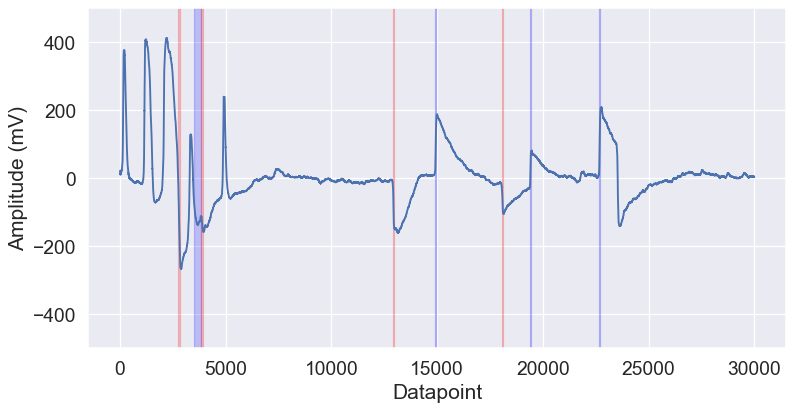

Vertical Saccades GroundTruth Plot


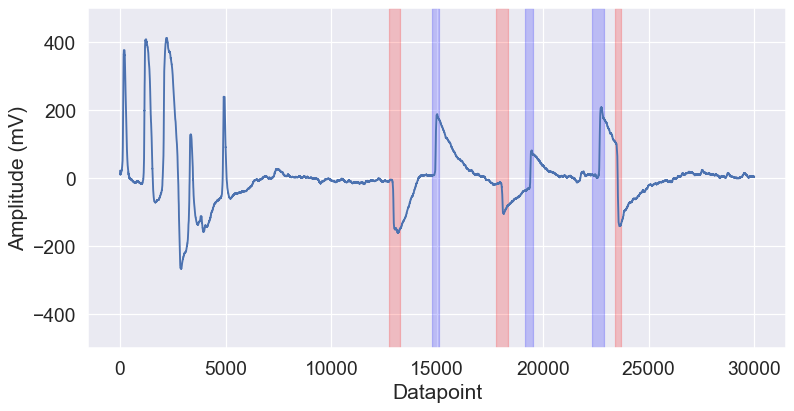

Vertical CWT Peaks Plot
len Peaks before 24
len Peaks after 24


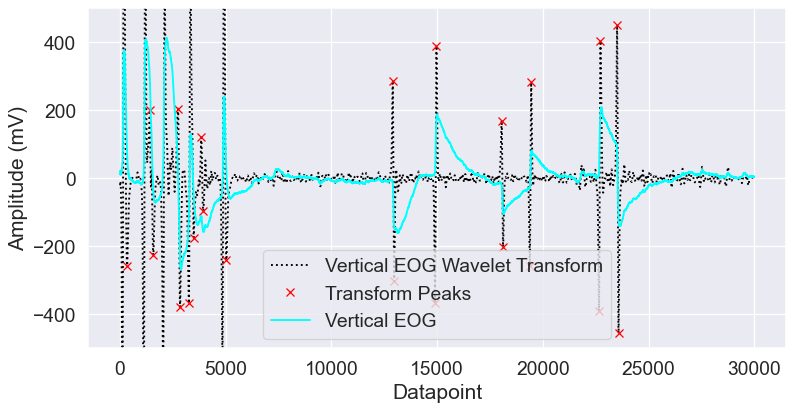

Horizontal Saccades Plot


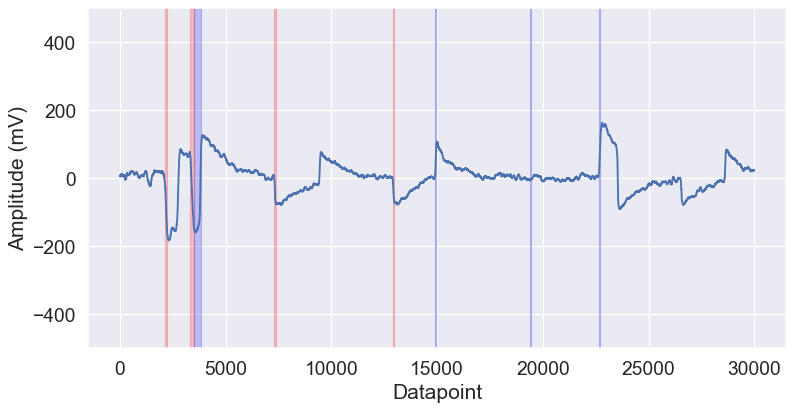

Horizontal Saccades GroundTruth Plot


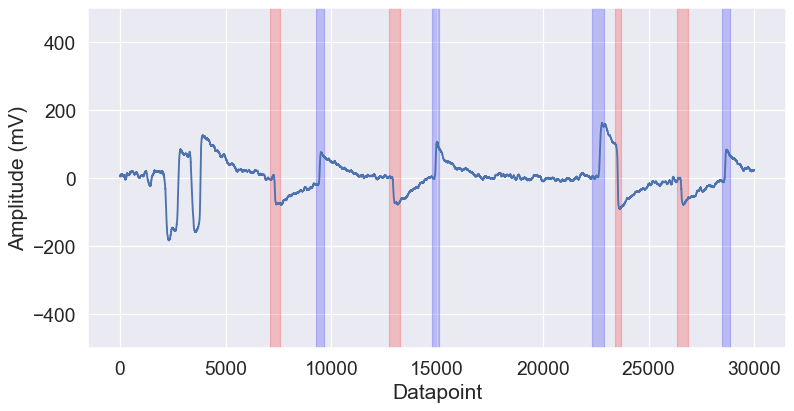

Horizontal CWT Peaks Plot
len Peaks before 24
len Peaks after 24


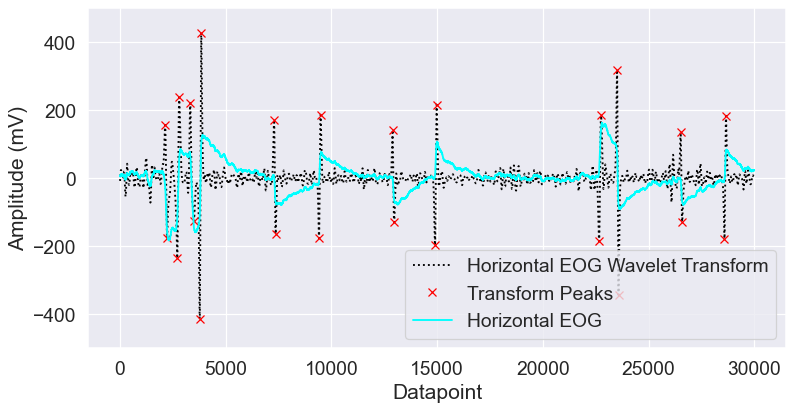

In [60]:
start=0
end=30000
sizeFig=10

newPeaksV = []
newPeaksH = []
newGroundTruth = []
newUpStartEnd = []
newDownStartEnd = []
newLeftStartEnd = []
newRightStartEnd = []

for peak in peaksV:
    if start <= peak <= end:
        newPeaksV.append(peak+start)
for peak in peaksH:
    if start <= peak <= end:
        newPeaksH.append(peak+start)
for gt in saccadeGroundTruth:
    if start <= int(float(gt[0])) and int(float(gt[1])) <= end:
        newGroundTruth.append(gt)
        
for up in upSaccadeStartEnd:
    if start <= up[0] and up[0] <= end:
        newUpStartEnd.append(up)
        
for down in downSaccadeStartEnd:
    if start <= down[0] and down[0] <= end:
        newDownStartEnd.append(down)

for left in upSaccadeStartEnd:
    if start <= left[0] and left[0] <= end:
        newLeftStartEnd.append(left)
        
for right in rightSaccadeStartEnd:
    if start <= right[0] and right[0] <= end:
        newRightStartEnd.append(right)

print('Vertical and Horizontal Denoised signal Plot')
plotVertHorEOG(verticalEogDenoised[start:end], horizontalEogDenoised[start:end],  mode='both', figSize=sizeFig)
plt.show()

print('Vertical Saccades Plot')
plotSaccadeSpanInSignal(verticalEOG[start:end], newUpStartEnd, newDownStartEnd, figSize=sizeFig)
plt.show()

print('Vertical Saccades GroundTruth Plot')
plotSaccadeGTSpanInSignal(verticalEOG[start:end], newGroundTruth, 'vertical', figSize=sizeFig)
plt.show()

print('Vertical CWT Peaks Plot')
plotTransformAndPeaks(coefVertMexHat1[start:end], newPeaksV, verticalEOG[start:end], 'Vertical', figSize=sizeFig)
plt.show()

print('Horizontal Saccades Plot')
plotSaccadeSpanInSignal(horizontalEOG[start:end], newLeftStartEnd, newRightStartEnd, figSize=sizeFig)
plt.show()

print('Horizontal Saccades GroundTruth Plot')
plotSaccadeGTSpanInSignal(horizontalEOG[start:end], newGroundTruth, 'horizontal', figSize=sizeFig)
plt.show()

print('Horizontal CWT Peaks Plot')
plotTransformAndPeaks(coefHoriMexHat1[start:end], newPeaksH, horizontalEOG[start:end], 'Horizontal', figSize=sizeFig)
plt.show() 